In [1]:
# Use of a language server will make this notebook easier to understand. I recommend using the jupyter support in vscode.

import csv
import matplotlib.pyplot as plt
from snsphd import viz
import numpy as np
from snsphd.hist import SplineTool
from snsphd.help import prinfo
from snsphd.layout import bisect, margin

from scipy.signal import find_peaks


from typing import Tuple

Colors, swatches = viz.phd_style(jupyterStyle=True, svg_mode=True)
from dataclasses import dataclass

from scipy.optimize import leastsq, curve_fit

import json

from utils import load_spectrum_file, gaussian, frequency_and_bandwidth

from pydantic import BaseModel

from spdc_functions import (
    ExtraordinaryIndex,
    ExtraordinaryIndex1Percent,
    OrdinaryIndex,
    DetectorParams,
    SpdcParams,
    JointSpectrumParams,
    FilteredJointSpectrumParams,
    DwdmTransIdler,
    DwdmTransSignal,
    GaussianFilterParams,
    Mgo_doped_Linb03_calculate_indexes,
    Linb03_calculate_indexes,
    refractive_index_ppln,
    gaussian2D,
    detector_profile,
    pump_envelope,
    phase_mismatch,
    # sinc2,
    sinc2_monochromatic,
    spdc_profile,
    wl_pump_envelope,
    joint_spectrum,
    joint_spectrum_no_detector,
    wrapper_joint_spectrum,
    single_filter,
    lmfit_wrapper_join_spectrum,
    lmfit_wrapper_join_spectrum_filter_integrate,
    lmfit_wrapper_join_spectrum_filter_integrate_cs,
    Dwdm,
    dwdm2D,
    create_signal_idler_arrays,
    load_filter_result_into_model,
    save_model_to_json,
    load_model_from_json,
    run_lmfit_filter,
    
)

from bokeh.plotting import figure, show
from bokeh.models import HoverTool
import numpy as np
from bokeh.io import output_notebook

from lmfit import Model
from lmfit.model import ModelResult
from matplotlib.colors import Normalize


# %load_ext snakeviz


The jsi takes the form: 
$$|f(\omega_s, \omega_i)|^2 = |\psi_{\mathrm{ph}}\left(\omega_s, \omega_i\right)|^2 *|\psi_p\left(\omega_s, \omega_i\right)|^2$$


The ~770 nm light out of the SHG was measured with a spectrum analyzer. With this, the pump envelope intensity $|\psi_p\left(\omega_s, \omega_i\right)|^2$ can be estimated

SHG wavelength:  769.7826952387038
SHG bandwidth sigma:  0.2036689594173765


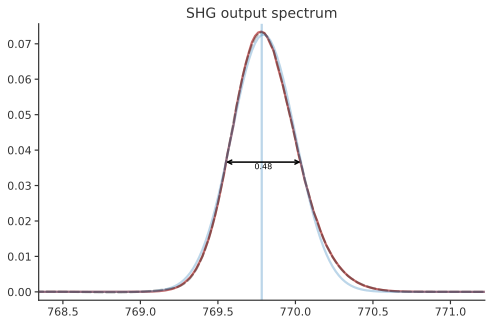

In [2]:


name_path = "..//data//shg_8_nm_filter//full power//WaveData20220726_012.csv"
wavelengths, values = load_spectrum_file(name_path)

fig, ax = plt.subplots(1,1, figsize=(8,5))
plt.plot(wavelengths, values, color=Colors['red'])

spline = SplineTool(np.array(values), np.array(wavelengths))
ax.plot(*spline.plot_spline(wavelengths,.001), color='k', ls='--', alpha=0.3)
spline.plot_width_at_level_arrows(ax, 0.5)
root = spline.full_width_at_level(0.5, .0001)

ax.set_xlim(spline.spline_max().x - 3*root.width, spline.spline_max().x + 3*root.width)
# print(root.right-root.left)
ax.set_title("SHG output spectrum")
ax.axvline(spline.spline_max().x, alpha=0.3)
ax.plot(*spline.plot_gaussian_fit(), alpha=0.3, label="gaussian fit")
print("SHG wavelength: ", spline.spline_max().x)
print("SHG bandwidth sigma: ", spline.sigma())


The data used for fitting to the JSI function is the DWDM grid data from figure 2 of the paper. This is arranged in an 8x8 grid, whereby the coincidence rate of channels near the main diagonal are measured.

In [3]:
with open("simplified_jsi_data_x8.json") as file:
    data = json.load(file)

# print("1: ", data["coinc_set"])
data["coinc_set_rounded"] = np.array(data["coinc_set"]) # or you'd have to use deepcopy



for i in range(len(data["coinc_set"])):
    for j in range(len(data["coinc_set"][0])):
        data["coinc_set_rounded"][i][j] = round(data["coinc_set"][i][j], 1)


data["wl_B"].reverse()

# make sure all data has correct orientation

if len(data["coinc_set"]) == 16:
    st = "\t        "
else:
    st = "\t "
for item in data["wl_B"]:
    if len(data["coinc_set"]) == 16:
        st = st + " " + str(item[:-3])
    if len(data["coinc_set"]) == 8:
        st = st + " " + str(item)
print(st)
np.array(data["coinc_set"])
for i, row in enumerate(data["coinc_set_rounded"]):
    st = str(data["wl_A"][i])
    for item in row:
        st = st + "\t   " + str(item)
    print(st)

# wl_B is along the top, 52 to 59
# wl_A is along the side, 35 to 42



	  1530.33 1531.12 1531.9 1532.68 1533.47 1534.25 1535.04 1535.82
1549.32	   68.5	   32.9	   4.3	   0.0	   0.0	   0.0	   0.0	   0.0
1548.51	   25.7	   65.6	   38.0	   5.4	   0.0	   0.0	   0.0	   0.0
1547.72	   2.7	   25.4	   62.9	   32.3	   4.7	   0.0	   0.0	   0.0
1546.92	   0.0	   2.6	   27.6	   69.5	   40.2	   6.9	   0.0	   0.0
1546.12	   0.0	   0.0	   2.5	   25.6	   63.7	   36.3	   4.0	   0.0
1545.32	   0.0	   0.0	   0.0	   2.8	   29.0	   82.4	   37.6	   5.2
1544.53	   0.0	   0.0	   0.0	   0.0	   2.2	   23.9	   61.0	   30.5
1543.73	   0.0	   0.0	   0.0	   0.0	   0.0	   2.7	   27.1	   72.9


In [4]:
# 'flatten' the data to 1d arrays for eventual use in scipy.curve_fit

flat_coinc = []
flat_wl_A = []
flat_wl_B = []

for i, row in enumerate(data["coinc_set"]):
    for j, column in enumerate(row):
        flat_coinc.append(column)
        flat_wl_B.append(data["wl_B"][j])
        flat_wl_A.append(data["wl_A"][i])

flat_coinc = np.array(flat_coinc)
flat_wl_A = np.array(flat_wl_A)
flat_wl_B = np.array(flat_wl_B)

zeros_mask = (flat_coinc!=0)
flat_coinc = flat_coinc[zeros_mask]
flat_wl_A = flat_wl_A[zeros_mask]
flat_wl_B = flat_wl_B[zeros_mask]


# signal <--> B--> Y <--> x ????
# idler <--> A <--> X <--> y


idler = flat_wl_A # long to short
signal = flat_wl_B # short to long

data3d = np.array(list(zip(idler,signal,flat_coinc)))

In [5]:

print(Linb03_calculate_indexes(1540, 10)) #, ExtraordinaryIndex(), OrdinaryIndex()))
print(Mgo_doped_Linb03_calculate_indexes(1540, 10, ExtraordinaryIndex(), OrdinaryIndex()))


2.2115694228379756
2.1270978468543214


775nm n:  2.1655870663979355
1540nm n:  2.1263986575132896
pickleable


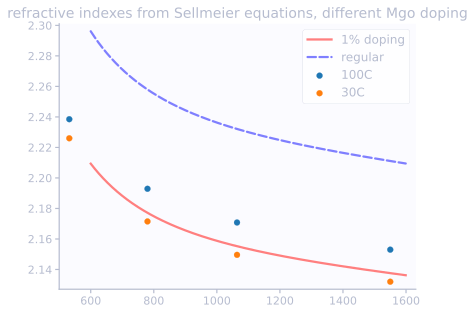

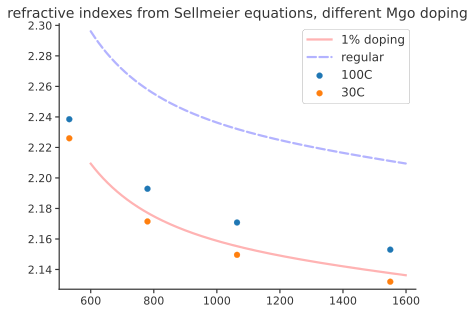

In [24]:
wavelengths = np.arange(600.0, 1600, 1.0).astype("float")
plt.figure()
plt.plot(
    wavelengths,
    Mgo_doped_Linb03_calculate_indexes(
        wavelengths, 50, ExtraordinaryIndex(), OrdinaryIndex()
    ),
    color="red",
    alpha=0.3,
    label="1% doping",
)
plt.plot(
    wavelengths,
    refractive_index_ppln(wavelengths),
    color="blue",
    alpha=0.3,
    ls="--",
    label="regular",
)

# these are some 'example' values from the covesion website.
plt.scatter([532, 780, 1064, 1550], [2.2385, 2.1929, 2.1708, 2.1530], label="100C")
plt.scatter([532, 780, 1064, 1550], [2.2260, 2.1715, 2.1496, 2.1320], label="30C")
plt.legend()
_ = plt.title("refractive indexes from Sellmeier equations, different Mgo doping")
print(
    "775nm n: ",
    Mgo_doped_Linb03_calculate_indexes(
        wavelengths[175], 20, ExtraordinaryIndex1Percent(), OrdinaryIndex()
    ),
)
print(
    "1540nm n: ",
    Mgo_doped_Linb03_calculate_indexes(
        wavelengths[940], 20, ExtraordinaryIndex1Percent(), OrdinaryIndex()
    ),
)

viz.save_light_dark_all(name="refractive_indices", loc="../figs/")

In [25]:
spline.spline_max().x * 2

1539.5653904774076

In [26]:
frequency_and_bandwidth(spline.spline_max().x, spline.sigma())

FreqBandwidth(freq=389.450762993622, freq_unit='THz', sigma=103.0408107664375, sigma_unit='GHz')

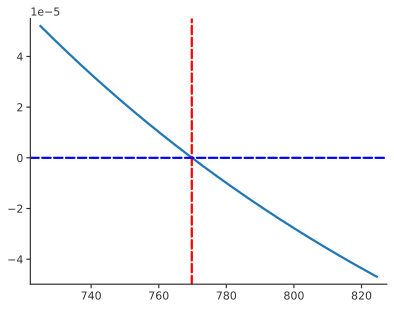

In [27]:
# This cell was used to vary gamma and temperature, to figure out for which values `phase_missmatch` is near zero at the pump wavelength. 

w_idler = np.arange(1450, 1650, 1)
w_signal = np.arange(1450, 1650, 1)
c = 3e8
gamma = 1 / 18300
v_idler, v_signal = c / w_idler, c / w_signal
v_pump = v_idler + v_signal
w_pump = c / v_pump


spdc_params = SpdcParams(
        w_central=spline.spline_max().x * 2,
        sigma_p=2*np.pi* frequency_and_bandwidth(spline.spline_max().x, spline.sigma()).sigma * 1e9,
        temp=128,
        L=1e7,
        gamma=gamma,  # 18.3 um polling period
        sellmeier_ordinary = OrdinaryIndex(),
        sellmeier_extraordinary = ExtraordinaryIndex1Percent()
    )

plt.plot(w_pump, phase_mismatch(w_idler, w_signal, w_pump, gamma, spdc_params.temp, spdc_params))
plt.axvline(spline.spline_max().x, color="red", ls="--")

plt.axhline(0, color="blue", ls="--")

From the previous cell, we know `ExtraordinaryIndex1Percent()` with a temp of about 128 C, and a polling period of 18.3 um gets us close to a phase matching functions that would overlap well with the pump envelope.

We can set up an initial datastructure for the JSI:

In [28]:
from dataclasses import asdict

params = JointSpectrumParams(
    detector=DetectorParams(sigma=53, w_0=1550),
    spdc=SpdcParams(
        w_central=spline.spline_max().x * 2,
        sigma_p=2*np.pi* frequency_and_bandwidth(spline.spline_max().x, spline.sigma()).sigma * 1e9,
        temp=129, 
        L=1e7,
        gamma=1 / 18300,  # 18.3 um polling period
        sellmeier_ordinary = OrdinaryIndex(),
        sellmeier_extraordinary = ExtraordinaryIndex1Percent(),
    ),
    A = 5e7
)


In [29]:
frequency_and_bandwidth(spline.spline_max().x, spline.sigma())

FreqBandwidth(freq=389.450762993622, freq_unit='THz', sigma=103.0408107664375, sigma_unit='GHz')

The sinc^2 function is centered at about 1540 nm, as we want:

In [30]:
num_points = 2000

w_idler = np.linspace(1450, 1650, num_points)
w_signal = np.linspace(1450, 1650, num_points)

this_red = sinc2_monochromatic(w_idler, w_signal, params.spdc.gamma, params.spdc)


output_notebook(hide_banner=True)
colors, swatches = viz.bokeh_theme()
p = figure(width=800, height=400, output_backend="webgl")
mask = (w_idler>1520) & (w_idler<1560)
p.line(x=w_idler[mask], y=this_red[mask], line_color=colors["red"], line_width=2, line_alpha=1)
hover = HoverTool(tooltips=[('x','@x ')])

p.add_tools(hover)
show(p)


In [31]:
print("")
print("refractive index @ 1540 nm: ",refractive_index_ppln(1540))
print("refractive index @ 770 nm: ",refractive_index_ppln(770))
print("")

print("choose that idler goes from short wavelength (like 1517) to up to 1540")
print("choose that signal goes from 1540 to longer wavelegnth")


refractive index @ 1540 nm:  2.21145099670458
refractive index @ 770 nm:  2.259374268658871

choose that idler goes from short wavelength (like 1517) to up to 1540
choose that signal goes from 1540 to longer wavelegnth


In [32]:
gamma_guess = 3e-4  # 3.9e-4
A_guess = 3e7  # 7481585.54714451
p_guess = [gamma_guess, A_guess]  # ,sigma_p_guess]
# if we want to float L, should fix sigma_p, because both have effects on width (can't optimize)

# you can use optimize.curve_fit to fit 2D data. See here:
#  https://scipython.com/blog/non-linear-least-squares-fitting-of-a-two-dimensional-data/

popt, pcov = curve_fit(
    wrapper_joint_spectrum(params), data3d[:, :2], data3d[:, 2], p0=p_guess #inputs x and y, outputs, and p0
)


In [33]:
signal_wl, idler_wl, X, Y = create_signal_idler_arrays(data["wl_A"], data["wl_B"])


prinfo(data["wl_A"])
prinfo(data["wl_B"])
prinfo(signal_wl[-1] - signal_wl[0])
prinfo(idler_wl[-1] - idler_wl[0])
prinfo(np.sum(np.diff(data["wl_A"])))
prinfo(np.sum(np.diff(data["wl_B"])))
prinfo(np.sum(np.diff(signal_wl)))

data["wl_A"] = [1549.32, 1548.51, 1547.72, 1546.92, 1546.12, 1545.32, 1544.53, 1543.73]
data["wl_B"] = [1530.33, 1531.12, 1531.9, 1532.68, 1533.47, 1534.25, 1535.04, 1535.82]
signal_wl[-1] - signal_wl[0] = 7.187142857142817
idler_wl[-1] - idler_wl[0] = 7.087142857142908
np.sum(np.diff(data["wl_A"])) = -5.589999999999918
np.sum(np.diff(data["wl_B"])) = 5.490000000000009
np.sum(np.diff(signal_wl)) = 7.187142857142817


Text(-0.01, 1.11, 'a)')

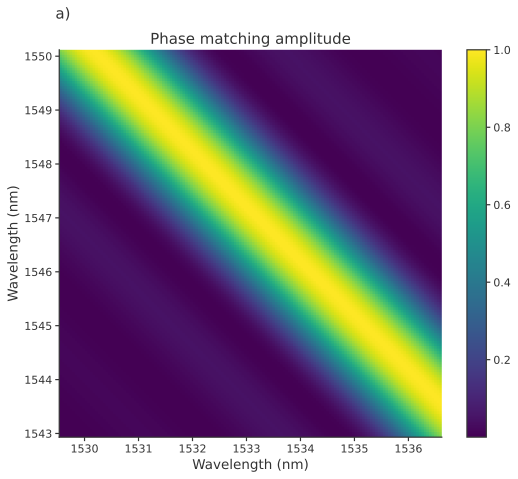

In [34]:
# X, Y = np.meshgrid(idler_wl, signal_wl)

params.spdc.L = 1e7
params.spdc.temp = 129
params.spdc.sellmeier_extraordinary = ExtraordinaryIndex1Percent()
detector_mat = detector_profile(X, Y, params.detector)
sinc2_mat = sinc2_monochromatic(X, Y, params.spdc.gamma, params.spdc)
################################ Plot

fontsize = 10*1.5
fontsize_x = 9*1.5
fontsize_y = 9*1.5
labelsize = 8*1.5
ticks = np.arange(0, 1.25, 0.25)
# Plotting modes

fig, ax = plt.subplots(1,1,figsize=(9,7))
ax_text_loc = (-0.01, 1.11)

z = sinc2_mat / np.max(sinc2_mat)
z = z[:-1, :-1]


img = ax.imshow(z,
           extent=[X.min(), X.max(), Y.min(), Y.max()],
           interpolation='nearest', origin='lower') # for faster
cbar = fig.colorbar(img, ax=ax)


ax.set_xlabel("Wavelength (nm)", fontsize=fontsize_x)
ax.set_ylabel("Wavelength (nm)", fontsize=fontsize_y)
ax.set_title("Phase matching amplitude", fontsize=fontsize)
ax.annotate(
    "a)",
    xy=ax_text_loc,
    xycoords="axes fraction",
    horizontalalignment="left",
    verticalalignment="top",
    fontsize=fontsize,
)

We've set up the initial conditions so that the data appears to match the model pretty well already (as seen in the slide below). But next we need to fit the model to the data and thereby converge to some optimal parameters for unknown constants like crystal temperature. 

In [35]:
detector_mat = detector_profile(X, Y, params.detector)
joint = joint_spectrum(X, Y, params.spdc.gamma, 50000000, params)

fontsize = 10*1.5
fontsize_x = 9*1.5
fontsize_y = 9*1.5
labelsize = 8*1.5
ticks = np.arange(0, 1.25, 0.25)
# Plotting modes

fig, ax = plt.subplots(1,1,figsize=(8,7))
ax_text_loc = (-0.01, 1.11)

z = joint
z = z[:-1, :-1]

cp = ax.pcolorfast(X, Y, z) # to make sure the axese are correct
cp = ax.imshow(z,
           extent=[X.min(), X.max(), Y.min(), Y.max()],
           vmin=z.min(), vmax=z.max(),
          #  vmin=0, vmax=1,
           interpolation='nearest', origin='lower') # for faster

norm = Normalize(vmin=0, vmax=1) # normalization based on the raw data

ax.set_xlabel("Wavelength (nm)", fontsize=fontsize_x)
ax.set_ylabel("Wavelength (nm)", fontsize=fontsize_y)
ax.set_title("Phase matching amplitude", fontsize=fontsize)
cbar = fig.colorbar(cp, ax=ax)
cbar.ax.tick_params(labelsize=labelsize)
cbar.set_ticks(ticks)
ax.annotate(
    "a)",
    xy=ax_text_loc,
    xycoords="axes fraction",
    horizontalalignment="left",
    verticalalignment="top",
    fontsize=fontsize,
)
sc = ax.scatter(
    flat_wl_B,
    flat_wl_A,
    marker="s",
    facecolors="None",
    c=flat_coinc/(0.86*np.max(flat_coinc)),
    cmap="viridis",
    norm=norm,
    s=390,
    alpha=1,
    edgecolors='darkgrey',
    linewidth = 1
)

params_old = params


Perform a fit using the lmfit package. This tool makes it easy to enable and disable the variability of certain parameters. It's basically just a convenience wrapper around `scipy.curve_fit()`

In [36]:
# lmfit_wrapper_join_spectrum

params.spdc.L = 0.5e6
mod = Model(lmfit_wrapper_join_spectrum)


lmfit_params = mod.make_params(detector_sigma=dict(value=params.detector.sigma, vary=False),
                               detector_w_0=dict(value=params.detector.w_0, vary=False),
                               spdc_w_central=dict(value=params.spdc.w_central, vary=True, min=1539.2, max=1539.9),
                               spdc_sigma_p=dict(value=params.spdc.sigma_p, vary=False, min=347424508247, max=1547424508247),
                               spdc_temp=dict(value=params.spdc.temp, vary=True, min=127, max=140),
                               spdc_L=dict(value=params.spdc.L, vary=True, min=1e3, max=2e7),
                               spdc_gamma=dict(value=params.spdc.gamma, vary=False, min=1/18400, max=1/18200),
                               A=dict(value=1e6, vary=True, min=1, max=2e10))

# mod.param_names

independent_data = data3d[:, :2]
dependent_data = data3d[:, 2]

result=mod.fit(dependent_data, lmfit_params, M=independent_data, method="powell")
# mod.independent_vars
result


In [37]:
# load the fitted values into the nested datastructure

detector_params = DetectorParams(sigma=result.best_values["detector_sigma"], w_0=result.best_values["detector_w_0"])
spdc_params = SpdcParams(
        w_central=result.best_values["spdc_w_central"],
        sigma_p=result.best_values["spdc_sigma_p"],
        temp=result.best_values["spdc_temp"],
        L=result.best_values["spdc_L"],
        gamma=result.best_values["spdc_gamma"],
        sellmeier_ordinary=OrdinaryIndex(),
        sellmeier_extraordinary=ExtraordinaryIndex1Percent(),
    )
fit_params = JointSpectrumParams(detector=detector_params, spdc=spdc_params, A=result.best_values["A"])

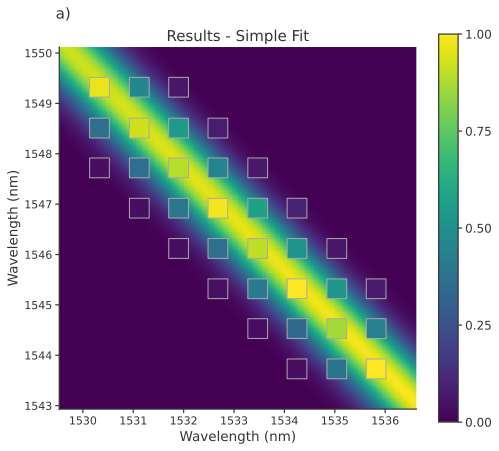

In [38]:
fit_params.spdc.L = 1e7

joint = joint_spectrum(X, Y, fit_params.spdc.gamma, fit_params.A, fit_params)

fontsize = 10*1.5
fontsize_x = 9*1.5
fontsize_y = 9*1.5
labelsize = 8*1.5
ticks = np.arange(0, 1.25, 0.25)
# Plotting modes
fig, ax = plt.subplots(1,1,figsize=(8,7))
ax_text_loc = (-0.01, 1.11)
z = joint
z = z[:-1, :-1]

norm = Normalize(vmin=0, vmax=1) # normalization based on the raw data


z_normalized_by_raw_data = z/(0.86*np.max(flat_coinc))

# cp = ax.pcolorfast(X, Y, z) # to make sure the axese are correct
cp = ax.imshow(z_normalized_by_raw_data,
           extent=[X.min(), X.max(), Y.min(), Y.max()],
           vmin=0, vmax=1,
           interpolation='nearest', origin='lower') # for faster

ax.set_xlabel("Wavelength (nm)", fontsize=fontsize_x)
ax.set_ylabel("Wavelength (nm)", fontsize=fontsize_y)
ax.set_title("Results - Simple Fit", fontsize=fontsize)
cbar = fig.colorbar(cp, ax=ax)
cbar.ax.tick_params(labelsize=labelsize)
cbar.set_ticks(ticks)
ax.annotate(
    "a)",
    xy=ax_text_loc,
    xycoords="axes fraction",
    horizontalalignment="left",
    verticalalignment="top",
    fontsize=fontsize,
)

sc = ax.scatter(
    flat_wl_B,
    flat_wl_A,
    marker="s",
    facecolors="None",
    c=flat_coinc/(0.86*np.max(flat_coinc)),
    cmap="viridis",
    norm=norm,
    s=390,
    alpha=1,
    edgecolors='darkgrey',
    linewidth = 1
)


In [39]:
X_flat = np.average(X, axis=0)

def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx

find_nearest(X, 1530.33)
X_flat[find_nearest(X, 1530.33)]



1530.3400287631875

In [40]:
from bokeh.plotting import figure, show
import numpy as np
from bokeh.io import output_notebook
output_notebook(hide_banner=True)
   
dwdm_g = Dwdm(gaussian=True, width_adj=1)
dwdm = Dwdm()

wl = np.linspace(1520, 1590, 1000)
wl_fg = dwdm_g.from_array(wl, 1535)
wl_f = dwdm.from_array(wl, 1535)



# plt.plot(wl, wl_f)

colors, swatches = viz.bokeh_theme()

p = figure(width=800, height=400, output_backend="webgl")
# p.line(x=wl, y=wl_fg, line_color=colors["blue"], line_width=2, line_alpha=1)
p.line(x=wl, y=wl_f, line_color=colors["red"], line_width=2, line_alpha=1)
p.circle(x=wl, y=wl_f, line_color=colors["red"], color=colors["red"], size=5, alpha=1)
hover = HoverTool(tooltips=[('x','$x{1.111} '), ('y', '$y')], mode="vline", line_policy="interp")

p.add_tools(hover)
show(p)




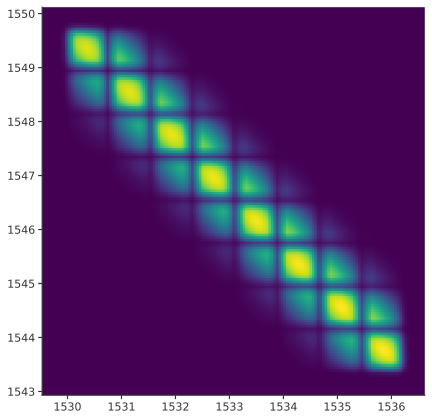

In [41]:
flat = np.ones((150,150))

fontsize = 10*1.5
fontsize_x = 9*1.5
fontsize_y = 9*1.5
labelsize = 8*1.5
ticks = np.arange(0, 1.25, 0.25)
# Plotting modes

fig, ax = plt.subplots(1,1,figsize=(8,7))
ax_text_loc = (-0.01, 1.11)


norm = Normalize(vmin=0, vmax=1) # normalization based on the raw data


dwdm_2d = np.zeros(np.shape(X))
for wl_B in data["wl_B"]:
    for wl_A in data["wl_A"]:
        dwdm_2d += dwdm2D(X,Y, wl_B, wl_A, width_adj=1) #, gaussian=True)


# signal --> B--> X
# idler --> A--> Y
joint = joint_spectrum(X, Y, fit_params.spdc.gamma, fit_params.A, fit_params)
z = joint*dwdm_2d

dwdm_joint = joint*dwdm_2d/(np.max(joint*dwdm_2d))


z = dwdm_joint[:-1, :-1]

# cp = ax.pcolorfast(X, Y, z) # to make sure the axese are correct
cp = ax.imshow(z,
           extent=[X.min(), X.max(), Y.min(), Y.max()],
           vmin=0, vmax=1,
           interpolation='nearest', origin='lower') # for faster

In [42]:
WIDTH = 0.5
signal_wl, idler_wl, X, Y = create_signal_idler_arrays(data["wl_A"], data["wl_B"], number_pts=800)
joint = joint_spectrum(X, Y, fit_params.spdc.gamma, fit_params.A, fit_params)
single_dwdm_2d = dwdm2D(X,Y, data["wl_B"][4], data["wl_A"][4], width_adj=WIDTH) #, gaussian=True)
dwdm_joint_single = joint*single_dwdm_2d

# z = z/(np.max(joint)*np.max(dwdm_2d))
dwdm_joint_single = dwdm_joint_single/(np.max(dwdm_joint_single))


u_dwdm, s_dwdm, vh_dwdm = np.linalg.svd(dwdm_joint_single)#/np.sum(signal1_idler_twofold))
svd_dwdm = s_dwdm/np.sum(s_dwdm)
ssum = np.sum(svd_dwdm**2)
K= 1/ssum
prinfo(K)
inverse_K = 1/K
prinfo(inverse_K)

K = 1.0381218772094545
inverse_K = 0.9632780331034649


Text(0.5, 1.0, 'Schmidt Decomposition Coefficients')

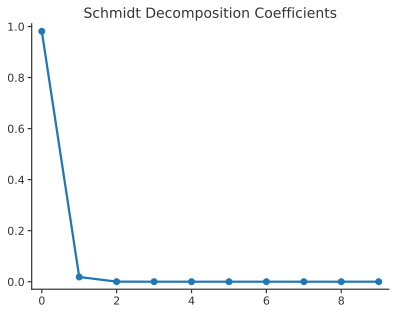

In [43]:
plt.plot(svd_dwdm[:10], '-o')
plt.title("Schmidt Decomposition Coefficients")

## filter intergrate fit:

The previous fitted model evaluated the values of the JIS at singular points that corresponded to the center pass-bands of all the DWDM channels. This worked well enough, though it's more accurate to think of the the filters and defining integrations over the JSI. If the JSI is narrow-band relative to the pass-band of the filters, this would matter more. For this JSI, the difference in derived fitting parameters is small. However, this integration method is a step towards a full model (a few cells down) of the DWDM filtering that includes the singles rates measurements and efficiency parameters for all filter channels. 

In [44]:
# this takes several seconds. Internally, this is using a 80x80 point grid for integration. 

mod = Model(lmfit_wrapper_join_spectrum_filter_integrate)
params.spdc.L = 10e6


lmfit_params_fi = mod.make_params(
                               detector_sigma=dict(value=params.detector.sigma, vary=False),
                               detector_w_0=dict(value=params.detector.w_0, vary=False),
                               spdc_w_central=dict(value=params.spdc.w_central, vary=False, min=1539.2, max=1542),
                               spdc_sigma_p=dict(value=params.spdc.sigma_p, vary=False),
                               spdc_temp=dict(value=params.spdc.temp, vary=True, min=127, max=140),
                               spdc_L=dict(value=params.spdc.L, vary=False, min=1e3, max=2e7),
                               spdc_gamma=dict(value=params.spdc.gamma, vary=False, min=1/18400, max=1/18200),
                               A=dict(value=1e4, vary=True, min=1e3, max=1e8))

independent_data = data3d[:, :2]
dependent_data = data3d[:, 2]

result=mod.fit(dependent_data, lmfit_params_fi, M=independent_data, method="powell")
# mod.independent_vars
result

In [45]:
detector_params = DetectorParams(sigma=result.best_values["detector_sigma"], w_0=result.best_values["detector_w_0"])
spdc_params = SpdcParams(
        w_central=result.best_values["spdc_w_central"],
        sigma_p=result.best_values["spdc_sigma_p"],
        temp=result.best_values["spdc_temp"],
        L=result.best_values["spdc_L"],
        gamma=result.best_values["spdc_gamma"],
        sellmeier_ordinary=OrdinaryIndex(),
        sellmeier_extraordinary=ExtraordinaryIndex1Percent(),
    )
fit_params = JointSpectrumParams(detector=detector_params, spdc=spdc_params, A=result.best_values["A"])

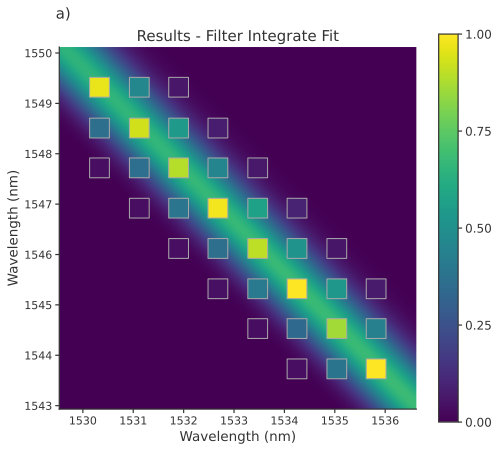

In [46]:
fit_params.spdc.L = 1e7

joint = joint_spectrum(X, Y, fit_params.spdc.gamma, fit_params.A, fit_params)

fontsize = 10*1.5
fontsize_x = 9*1.5
fontsize_y = 9*1.5
labelsize = 8*1.5
ticks = np.arange(0, 1.25, 0.25)
# Plotting modes
fig, ax = plt.subplots(1,1,figsize=(8,7))
ax_text_loc = (-0.01, 1.11)

# need the 19.861 value because the filters aren't normalized to an integral of 1
z = joint*19.861
z = z[:-1, :-1]

norm = Normalize(vmin=0, vmax=1) # normalization based on the raw data


z_normalized_by_raw_data = z/(0.86*np.max(flat_coinc))

# cp = ax.pcolorfast(X, Y, z) # to make sure the axese are correct
cp = ax.imshow(z_normalized_by_raw_data,
           extent=[X.min(), X.max(), Y.min(), Y.max()],
           vmin=0, vmax=1,
           interpolation='nearest', origin='lower') # for faster

ax.set_xlabel("Wavelength (nm)", fontsize=fontsize_x)
ax.set_ylabel("Wavelength (nm)", fontsize=fontsize_y)
ax.set_title("Results - Filter Integrate Fit", fontsize=fontsize)
cbar = fig.colorbar(cp, ax=ax)
cbar.ax.tick_params(labelsize=labelsize)
cbar.set_ticks(ticks)
ax.annotate(
    "a)",
    xy=ax_text_loc,
    xycoords="axes fraction",
    horizontalalignment="left",
    verticalalignment="top",
    fontsize=fontsize,
)

sc = ax.scatter(
    flat_wl_B,
    flat_wl_A,
    marker="s",
    facecolors="None",
    c=flat_coinc/(0.86*np.max(flat_coinc)),
    cmap="viridis",
    norm=norm,
    s=390,
    alpha=1,
    edgecolors='darkgrey',
    linewidth = 1
)

### Fitting DWDM filter transmission and $\mu$ per $nm^2$

So far, we haven't considered the non-unity transmission of the DWDM filters. We also haven't made use of the singles count rate (raw count rate on the SNSPDs, not coincidences). We can update the independent and dependent data arrays, and make changes to the fitting function to include this data. 

This way, the transmission of the filters can be modeled, and the $\mu$ inside the crystal per $nm^2$ can be backed out

In [47]:
# set up addendums for data3d that include the singles count rates. These singles rates only relate to one filter,
# so the other column in data3d is set to 0, as a placeholder. Handling the new format for these extra rows in data3d 
# requires some changes to the fitting function function (see how `run_lmfit_filter()` and the model function 
# `lmfit_wrapper_join_spectrum_filter_integrate_cs `is defined). 

with open("simplified_jsi_data_x8.json") as file:
    x8_data = json.load(file)

x8_data["wl_B"].reverse()


addendum_1 = np.zeros((8,3))
for i, (single_A,wl_B) in enumerate(zip(x8_data["singles_A_rate"], x8_data["wl_B"])):
    # print(f"single_A: {single_A}, wl_B: {wl_B}")
    addendum_1[i] = np.array([0, wl_B, single_A])

print(addendum_1)


print()
print()
addendum_2 = np.zeros((8,3))
for i, (single_B,wl_A) in enumerate(zip(x8_data["singles_B_rate"], x8_data["wl_A"])):
    # print(f"single_B: {single_B}, wl_B: {wl_A}")
    addendum_2[i] = np.array([wl_A, 0, single_B])

print(addendum_2)

[[      0.            1530.33        947506.78163954]
 [      0.            1531.12        908605.82802933]
 [      0.            1531.9         955672.42841638]
 [      0.            1532.68        964518.46518396]
 [      0.            1533.47       1052340.7908836 ]
 [      0.            1534.25       1154154.35831054]
 [      0.            1535.04       1077514.36087079]
 [      0.            1535.82       1220875.08354551]]


[[   1549.32             0.         1032701.12399566]
 [   1548.51             0.         1039981.46208415]
 [   1547.72             0.          953713.46857103]
 [   1546.92             0.         1029696.66404261]
 [   1546.12             0.          876244.67448047]
 [   1545.32             0.         1009865.82755658]
 [   1544.53             0.          796651.44544104]
 [   1543.73             0.          901759.51200142]]


In [48]:
# covert coincidence rate to coincidence/s (from Kcoin/s) to match the addendum data
data3d_t = data3d
data3d_t[:, 2:] = data3d[:,2:]*1000
data3d_new = np.concatenate((data3d_t, addendum_1, addendum_2))

In [49]:
# takes about 5 minutes if `load_prior_fit=False`

# note, the fit is sensitive to the starting values and min/max values for A, and the filter efficiencies. Getting the
# initial guess wrong results in a fit that doesn't converge to high R^2 properly

# detector non-unity efficiency component is disabled for this fit, as we assume detector inefficiency
# is incorporated into the filter efficiencies.

params.spdc.L = 10e6
params.A = 7e10

result, model= run_lmfit_filter(
    params,
    data3d_new,
    load_prior_fit=True,
    file_name="filter_fit_params.json",
    method="powell",
)
# "model" is of type "FilteredJointSpectrumParams" which contains all the fitted filter transmissions
result

found zero y. Other transmission [-1] is ignored
found zero y. Other transmission [-1] is ignored
found zero y. Other transmission [-1] is ignored
found zero y. Other transmission [-1] is ignored
found zero y. Other transmission [-1] is ignored
found zero y. Other transmission [-1] is ignored
found zero y. Other transmission [-1] is ignored
found zero y. Other transmission [-1] is ignored
found zero x. Other transmission [-1] is ignored
found zero x. Other transmission [-1] is ignored
found zero x. Other transmission [-1] is ignored
found zero x. Other transmission [-1] is ignored
found zero x. Other transmission [-1] is ignored
found zero x. Other transmission [-1] is ignored
found zero x. Other transmission [-1] is ignored
found zero x. Other transmission [-1] is ignored
found zero y. Other transmission [-1] is ignored
found zero y. Other transmission [-1] is ignored
found zero y. Other transmission [-1] is ignored
found zero y. Other transmission [-1] is ignored
found zero y. Other 

In [50]:


a = lmfit_wrapper_join_spectrum_filter_integrate_cs(
    independent_data,
    fit_params.detector.sigma,
    fit_params.detector.w_0,
    fit_params.spdc.w_central,
    fit_params.spdc.sigma_p,
    fit_params.spdc.temp,
    fit_params.spdc.L,
    fit_params.spdc.gamma,
    fit_params.A,
    signal_ch_35=result.best_values["signal_ch_35"],
    signal_ch_36=result.best_values["signal_ch_36"],
    signal_ch_37=result.best_values["signal_ch_37"],
    signal_ch_38=result.best_values["signal_ch_38"],
    signal_ch_39=result.best_values["signal_ch_39"],
    signal_ch_40=result.best_values["signal_ch_40"],
    signal_ch_41=result.best_values["signal_ch_41"],
    signal_ch_42=result.best_values["signal_ch_42"],
    idler_ch_52=result.best_values["idler_ch_52"],
    idler_ch_53=result.best_values["idler_ch_53"],
    idler_ch_54=result.best_values["idler_ch_54"],
    idler_ch_55=result.best_values["idler_ch_55"],
    idler_ch_56=result.best_values["idler_ch_56"],
    idler_ch_57=result.best_values["idler_ch_57"],
    idler_ch_58=result.best_values["idler_ch_58"],
    idler_ch_59=result.best_values["idler_ch_59"],
)


In [51]:
model.idler_filters

DwdmTransIdler(ch_52=0.2138113905511989, ch_53=0.18977528757818807, ch_54=0.20561308817363427, ch_55=0.18106330724639996, ch_56=0.17267851345181617, ch_57=0.16330930618006329, ch_58=0.1600526113952659, ch_59=0.1636347840890483, ch_52_wl=1535.82, ch_53_wl=1535.04, ch_54_wl=1534.25, ch_55_wl=1533.47, ch_56_wl=1532.68, ch_57_wl=1531.9, ch_58_wl=1531.12, ch_59_wl=1530.33)

In [52]:
from spdc_functions import evaluate_model


# returns \mu*rep_rate
DwdmTransIdler().ch_59
evaluate_model(
    model,
    DwdmTransIdler().ch_56_wl,
    DwdmTransSignal().ch_38_wl,
    1,      # model.idler_filters.ch_59,
    1,       # model.signal_filters.ch_35,
    enable_detector = False
)

2167705.475917687

In [53]:
fitted_A = model.A
print(f"fitted A: {fitted_A}")

fitted A: 9008996.57087768


In [54]:
# this is used for the thought expirement that explains 
# why prevailing equations for calculation of \mu don't 
# work in the narroband filtering regime
extra_high_A = fitted_A*200
model.A = extra_high_A
super_narro_band_x = evaluate_model(
    model,
    0.0,
    (DwdmTransSignal().ch_38_wl + DwdmTransSignal().ch_37_wl)/2,
    1,      # model.idler_filters.ch_59,
    1,       # model.signal_filters.ch_35,
    enable_detector = False,
    width_scalar=0.05
)

super_narro_band_y = evaluate_model(
    model,
    (DwdmTransIdler().ch_56_wl + DwdmTransIdler().ch_55_wl)/2,
    0.0,
    1,      # model.idler_filters.ch_59,
    1,       # model.signal_filters.ch_35,
    enable_detector = False,
    width_scalar=0.05
)

super_narro_band_coinc = evaluate_model(
    model,
    (DwdmTransIdler().ch_56_wl + DwdmTransIdler().ch_55_wl)/2,
    (DwdmTransSignal().ch_38_wl + DwdmTransSignal().ch_37_wl)/2,
    1,      # model.idler_filters.ch_59,
    1,       # model.signal_filters.ch_35,
    enable_detector = False,
    width_scalar=0.05
)

prinfo(super_narro_band_x, super_narro_band_y, super_narro_band_coinc)
prinfo(super_narro_band_coinc/super_narro_band_x)

mu = (super_narro_band_x*super_narro_band_y)/(super_narro_band_coinc*4e9)
print(mu)


found zero x. Other transmission [1] is ignored
found zero y. Other transmission [1] is ignored
super_narro_band_x = 58063797.44636705
super_narro_band_y = 57683165.44745238
super_narro_band_coinc = 567897.7029367633
super_narro_band_coinc/super_narro_band_x = 0.009780581496780757
1.4744308778174027


In [55]:
np.diagonal(data["coinc_set"])

array([68.49316822, 65.60157078, 62.87730613, 69.48834089, 63.68992908,
       82.36173635, 61.0429554 , 72.91227598])

In [56]:
data["singles_B_rate"]

[1032701.1239956581,
 1039981.4620841458,
 953713.4685710326,
 1029696.6640426054,
 876244.6744804699,
 1009865.827556585,
 796651.4454410396,
 901759.5120014172]

In [57]:
ch_35_42_efficiencies = np.array([model.signal_filters.__dict__[f"ch_{i}"] for i in range(35,43)])
ch_35_42_singles = np.array(data["singles_B_rate"])

ch_59_52_efficiencies = np.array([model.idler_filters.__dict__[f"ch_{i}"] for i in range(59, 51, -1)])
ch_59_52_singles = np.array(data["singles_A_rate"])

coinc = np.diagonal(data["coinc_set"])

geometric_fraction_1 = (coinc*1000)/(ch_59_52_efficiencies*ch_35_42_singles)
prinfo(geometric_fraction_1)



geometric_fraction_2 = (coinc*1000)/(ch_35_42_efficiencies*ch_59_52_singles)
prinfo(geometric_fraction_2)

prinfo(np.average(geometric_fraction_1))
prinfo(np.average(geometric_fraction_2))

all_geometric_fractions = np.concatenate((geometric_fraction_1, geometric_fraction_2))

geo_fraction = np.average(all_geometric_fractions)
geo_fraction_err = np.std(all_geometric_fractions)
print(f"geometric fraction: {round(geo_fraction,3)} +/- {round(geo_fraction_err,3)}")

geometric_fraction_1 = [0.40531901 0.39411764 0.40370588 0.3908088  0.40143471 0.39665329
 0.40376395 0.37816304]
geometric_fraction_2 = [0.38442561 0.40185548 0.37975743 0.39826396 0.38733963 0.39218419
 0.40651726 0.36182634]
np.average(geometric_fraction_1) = 0.3967457927767529
np.average(geometric_fraction_2) = 0.3890212396300765
geometric fraction: 0.393 +/- 0.012


In [58]:
detector_params = DetectorParams(sigma=result.best_values["detector_sigma"], w_0=result.best_values["detector_w_0"])
spdc_params = SpdcParams(
        w_central=result.best_values["spdc_w_central"],
        sigma_p=result.best_values["spdc_sigma_p"],
        temp=result.best_values["spdc_temp"],
        L=result.best_values["spdc_L"],
        gamma=result.best_values["spdc_gamma"],
        sellmeier_ordinary=OrdinaryIndex(),
        sellmeier_extraordinary=ExtraordinaryIndex1Percent(),
    )
fit_params = JointSpectrumParams(detector=detector_params, spdc=spdc_params, A=result.best_values["A"])

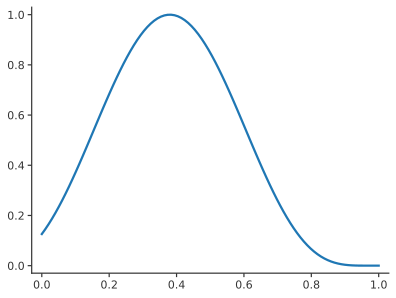

In [104]:
def parabola(x):
    return (np.abs(-2.8 * (x - 0.38) ** 2 + 1))**4

plt.plot(np.linspace(0, 1, 100), parabola(np.linspace(0, 1, 100)))

[[0.0210304 0.0122008 0.2195096 1.       ]
 [0.0267746 0.0121324 0.2243916 1.       ]
 [0.0321206 0.0122318 0.2297462 1.       ]
 ...
 [0.9635674 0.9786182 0.4288004 1.       ]
 [0.9661126 0.9839014 0.4349926 1.       ]
 [0.9690232 0.9890816 0.4394848 1.       ]]
pickleable


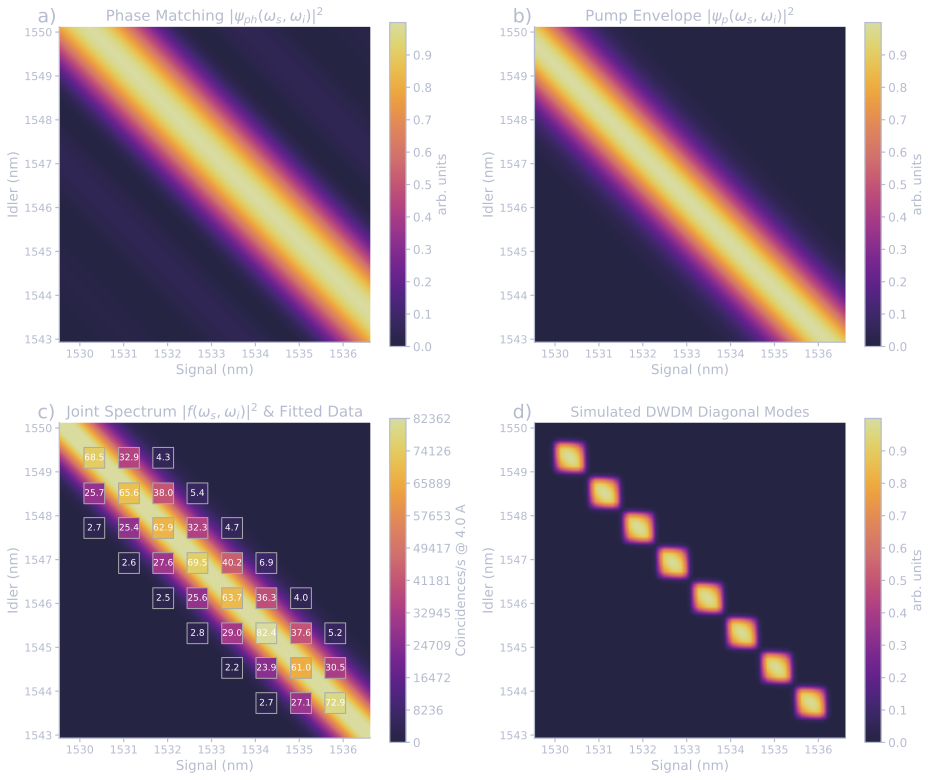

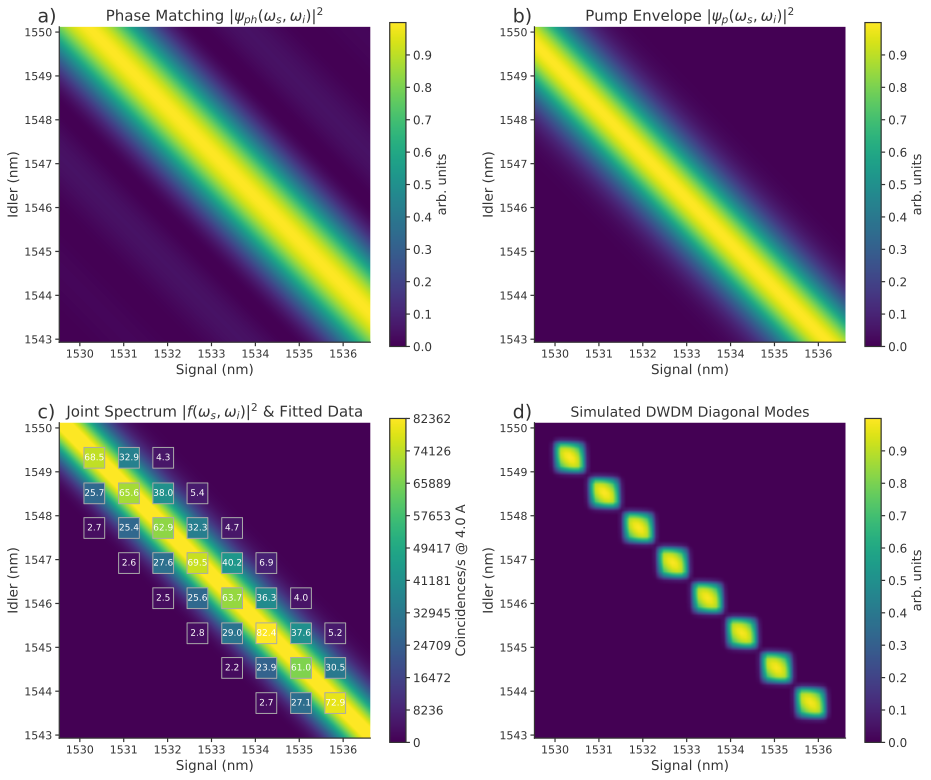

In [111]:
fontsize = 10*1.5
fontsize_x = 9*1.5
fontsize_y = 9*1.5
labelsize = 8*1.5



fig = plt.figure(figsize=(12, 10))
divider_width = 0.1
master_left, master_right = bisect(
            [0, 0, 1, 1],
            offset=0.5,
            spacing=divider_width,
            absolute_spacing=True,
        )
bottom_left, top_left = bisect(
            master_left,
            offset=0.5,
            direction="horiz",
            spacing=divider_width,
            absolute_spacing=True,
        )
bottom_right, top_right= bisect(
            master_right,
            offset=0.5,
            direction="horiz",
            spacing=divider_width,
            absolute_spacing=True,
        )
ax_top_left = fig.add_axes(top_left)
ax_bottom_left = fig.add_axes(bottom_left)
ax_top_right = fig.add_axes(top_right)
ax_bottom_right= fig.add_axes(bottom_right)

ax_text_loc = (-0.01, 1.11)


def plot_joint_spectrum(ax):
    scaling = np.max(flat_coinc*1000)
    ticks = np.arange(0, scaling, round(scaling/10,2))


    joint = joint_spectrum(X, Y, fit_params.spdc.gamma, fit_params.A, fit_params, enable_detector=False)
    z = joint
    z = z[:-1, :-1]

    norm = Normalize(vmin=0, vmax=scaling) # normalization based on the raw data


    z_normalized_by_raw_data = z/(0.92*np.max(flat_coinc*1000*80))

    # cp = ax.pcolorfast(X, Y, z) # to make sure the axese are correct
    cp = ax.imshow(scaling*z_normalized_by_raw_data,
            extent=[X.min(), X.max(), Y.min(), Y.max()],
            vmin=0, vmax=scaling,
            interpolation='nearest', origin='lower') # for faster

    ax.set_xlabel("Signal (nm)", fontsize=fontsize_x)
    ax.set_ylabel("Idler (nm)", fontsize=fontsize_y)
    ax.set_title(r"Joint Spectrum $|f(\omega_s, \omega_i)|^2$ & Fitted Data", fontsize=fontsize)
    cbar = fig.colorbar(cp, ax=ax)
    cbar.ax.tick_params(labelsize=labelsize)
    cbar.set_ticks(ticks)
    cbar.set_label("Coincidences/s @ 4.0 A")


    sc = ax.scatter(
        flat_wl_B,
        flat_wl_A,
        marker="s",
        facecolors="None",
        c=scaling*flat_coinc*1000/(0.92*np.max(flat_coinc*1000)),
        cmap="viridis",
        norm=norm,
        s=430,
        alpha=1,
        edgecolors='darkgrey',
        linewidth = 1
    )

    for i in range(len(data["coinc_set_rounded"])):
        for j in range(len(data["coinc_set_rounded"])):
            if data["coinc_set_rounded"][i][j] == 0:
                # label = '∅'
                label = ''
            else:
                label = data["coinc_set_rounded"][i][j]
            text = ax.text(data["wl_B"][j], data["wl_A"][i], label, size=9,
                        ha="center", va="center", 
                        color="white", alpha=1)

def plot_phase_matching_condition(ax):
    scaling = 1
    ticks = np.arange(0, scaling, round(scaling/10,2))
    c = 3 * 10**8 * 10**9  # nm/s
    phase_matching = sinc2_monochromatic(X, Y, fit_params.spdc.gamma, fit_params.spdc) # *pump_envelope(2*np.pi*c/X, 2*np.pi*c/Y, 2*np.pi*c/fit_params.spdc.w_central, fit_params.spdc.sigma_p)
    z = phase_matching
    z = z[:-1, :-1]/np.max(z)

    cp = ax.imshow(scaling*z,
            extent=[X.min(), X.max(), Y.min(), Y.max()],
            vmin=0, vmax=scaling,
            interpolation='nearest', origin='lower') # for faster

    ax.set_xlabel("Signal (nm)", fontsize=fontsize_x)
    ax.set_ylabel("Idler (nm)", fontsize=fontsize_y)
    ax.set_title(r"Phase Matching $|\psi_{ph}\left(\omega_s, \omega_i\right)|^2$", fontsize=fontsize)
    cbar = fig.colorbar(cp, ax=ax)
    cbar.ax.tick_params(labelsize=labelsize)
    cbar.set_ticks(ticks)
    cbar.set_label("arb. units")

def plot_pump_envelope(ax):
    scaling = 1
    ticks = np.arange(0, scaling, round(scaling/10,2))
    c = 3 * 10**8 * 10**9  # nm/s
    pump = pump_envelope(2*np.pi*c/X, 2*np.pi*c/Y, 2*np.pi*c/fit_params.spdc.w_central, fit_params.spdc.sigma_p)
    z = pump
    z = z[:-1, :-1]/np.max(z)
    cp = ax.imshow(scaling*z,
            extent=[X.min(), X.max(), Y.min(), Y.max()],
            vmin=0, vmax=scaling,
            interpolation='nearest', origin='lower') # for faster

    ax.set_xlabel("Signal (nm)", fontsize=fontsize_x)
    ax.set_ylabel("Idler (nm)", fontsize=fontsize_y)
    ax.set_title(r"Pump Envelope $|\psi_p\left(\omega_s, \omega_i\right)|^2$", fontsize=fontsize)
    cbar = fig.colorbar(cp, ax=ax)
    cbar.ax.tick_params(labelsize=labelsize)
    cbar.set_ticks(ticks)
    cbar.set_label("arb. units")

def plot_simulated_pump_transmission(ax):
    scaling = 1
    ticks = np.arange(0, scaling, round(scaling/10,2))
    dwdm_2d = np.zeros(np.shape(X))
    for i, wl_B in enumerate(data["wl_B"]):
        for j, wl_A in enumerate(data["wl_A"]):
            if i==j:
                dwdm_2d += dwdm2D(X,Y, wl_B, wl_A, width_adj=1, gaussian=False)
    joint = joint_spectrum(X, Y, fit_params.spdc.gamma, fit_params.A, fit_params, enable_detector=False)


    # z = z/(np.max(joint)*np.max(dwdm_2d))
    dwdm_joint = joint*dwdm_2d/(np.max(joint*dwdm_2d))


    z = dwdm_joint[:-1, :-1]

    # cp = ax.pcolorfast(X, Y, z) # to make sure the axese are correct
    cp = ax.imshow(z,
            extent=[X.min(), X.max(), Y.min(), Y.max()],
            vmin=0, vmax=1,
            interpolation='nearest', origin='lower') # for faster
    ax.set_title("Simulated DWDM Diagonal Modes")
    ax.set_xlabel("Signal (nm)", fontsize=fontsize_x)
    ax.set_ylabel("Idler (nm)", fontsize=fontsize_y)
    cbar = fig.colorbar(cp, ax=ax)
    cbar.ax.tick_params(labelsize=labelsize)
    cbar.set_ticks(ticks)
    cbar.set_label("arb. units")

plot_phase_matching_condition(ax_top_left)
plot_pump_envelope(ax_top_right)
plot_joint_spectrum(ax_bottom_left)
plot_simulated_pump_transmission(ax_bottom_right)

ax_top_left.text(-.07, 1.06, "a)", transform=ax_top_left.transAxes, fontsize=19, va="top")
ax_top_right.text(-.07, 1.06, "b)", transform=ax_top_right.transAxes, fontsize=19, va="top")

ax_bottom_left.text(-.07, 1.06, "c)", transform=ax_bottom_left.transAxes, fontsize=19, va="top")
ax_bottom_right.text(-.07, 1.06, "d)", transform=ax_bottom_right.transAxes, fontsize=19, va="top")

plt.savefig("JSI_sim_results.pdf")
viz.save_light_dark_all(fig, "../figs/JSI_sim_results")

found zero y. Other transmission [1] is ignored


C:\Users\Andrew\AppData\Local\Temp\ipykernel_17536\729812350.py:47: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=20, ha="right", rotation_mode="anchor")


pickleable


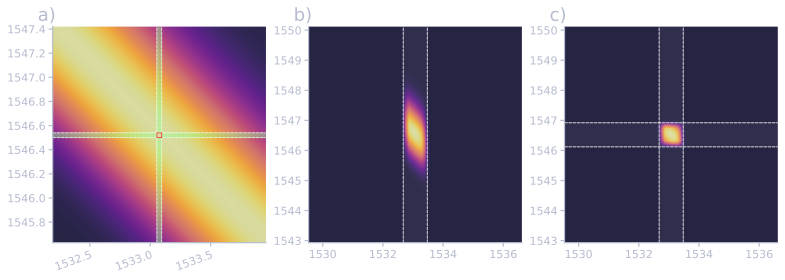

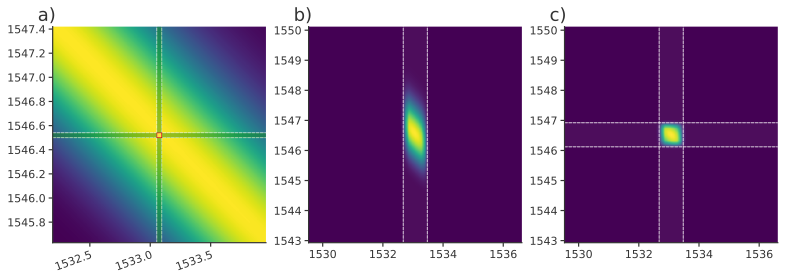

In [116]:
from matplotlib.patches import Rectangle

# # viz.update_colors(dark=False)
# viz.update_colors(dark=False)


crop = 300
joint = joint_spectrum(X[crop:-crop,crop:-crop], Y[crop:-crop,crop:-crop], fit_params.spdc.gamma, fit_params.A, fit_params, enable_detector=False)

joint_f_single = dwdm2D(X, Y, 1533.075, 0)*joint_spectrum(X, Y, fit_params.spdc.gamma, fit_params.A, fit_params, enable_detector=False)
joint_f_double = dwdm2D(X, Y, 1533.075, 1546.52)*joint_spectrum(X, Y, fit_params.spdc.gamma, fit_params.A, fit_params, enable_detector=False)
fig, ax = plt.subplots(1, 3, figsize=(13, 4))

ymin = Y[crop:-crop,crop:-crop].min()
ymax = Y[crop:-crop,crop:-crop].max()
xmin = X[crop:-crop,crop:-crop].min()
xmax = X[crop:-crop,crop:-crop].max()


ax[0].imshow(joint, extent=[xmin, xmax, ymin, ymax],
            vmin=0,
            interpolation='nearest', origin='lower') # for faster
square = Rectangle((1533.075-0.02, 1546.52-0.02), 0.04, 0.04, fill=False, edgecolor='red', linewidth=0.8, zorder=3)
ax[0].add_patch(square)

below = Rectangle((1533.075-0.02, ymin), 0.04, (1546.52-0.02) - ymin, fill=True, facecolor='green', edgecolor='none', zorder=3, alpha=0.4)
ax[0].add_patch(below)

above = Rectangle((1533.075-0.02, 1546.52+0.02), 0.04, -((1546.52+0.02) - ymax), fill=True, facecolor='green', edgecolor='none', zorder=3, alpha=0.4)
ax[0].add_patch(above)

left = Rectangle((xmin, 1546.52-0.02), (1533.075-0.02) - xmin, 0.04, fill=True, facecolor='green', edgecolor='none', zorder=3, alpha=0.4)
ax[0].add_patch(left)

right = Rectangle((1533.075+0.02, 1546.52-0.02), xmax - (1533.075+0.02), 0.04, fill=True, facecolor='green', edgecolor='none', zorder=3, alpha=0.4)
ax[0].add_patch(right)
# ax[0].set_title("Ultra-Narroband Filtering")


ax[0].axhline(1546.52+0.02, color='w', linestyle='--', lw=0.8)
ax[0].axhline(1546.52-0.02, color='w', linestyle='--', lw=0.8)
ax[0].axhspan(1546.52-0.02, 1546.52+0.02, alpha=0.05, color='w')

ax[0].axvline(1533.075+0.02, color='w', linestyle='--', lw=0.8)
ax[0].axvline(1533.075-0.02, color='w', linestyle='--', lw=0.8)
ax[0].axvspan(1533.075-0.02, 1533.075+0.02, alpha=0.05, color='w')
ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=20, ha="right", rotation_mode="anchor")
ax[0].text(-.07, 1.09, "a)", transform=ax[0].transAxes, fontsize=18, va="top")


ax[1].imshow(joint_f_single, extent=[X.min(), X.max(), Y.min(), Y.max()],
            vmin=0,
            interpolation='nearest', origin='lower') # for faster

ax[1].axvline(1533.075+0.4, color='w', linestyle='--', lw=0.8)
ax[1].axvline(1533.075-0.4, color='w', linestyle='--', lw=0.8)
ax[1].axvspan(1533.075-0.4, 1533.075+0.4, alpha=0.05, color='w')
ax[1].text(-.07, 1.09, "b)", transform=ax[1].transAxes, fontsize=18, va="top")


ax[2].imshow(joint_f_double, extent=[X.min(), X.max(), Y.min(), Y.max()],
            vmin=0,
            interpolation='nearest', origin='lower') # for faster

ax[2].axhline(1546.52+0.4, color='w', linestyle='--', lw=0.8)
ax[2].axhline(1546.52-0.4, color='w', linestyle='--', lw=0.8)
ax[2].axhspan(1546.52-0.4, 1546.52+0.4, alpha=0.05, color='w')

ax[2].axvline(1533.075+0.4, color='w', linestyle='--', lw=0.8)
ax[2].axvline(1533.075-0.4, color='w', linestyle='--', lw=0.8)
ax[2].axvspan(1533.075-0.4, 1533.075+0.4, alpha=0.05, color='w')
_ = ax[2].text(-.07, 1.09, "c)", transform=ax[2].transAxes, fontsize=18, va="top")
fig.patch.set_facecolor('none')
# fig.savefig("filtering_considerations_light.pdf", bbox_inches='tight')

# viz.save_light_dark_all(fig, "filter_considerations")
viz.save_light_dark_all(fig, "../figs/filter_considerations", override_alpha=True)

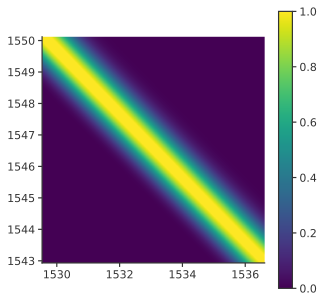

In [171]:
fig, ax = plt.subplots(1,1, figsize=(5,5))
joint = joint_spectrum(X, Y, fit_params.spdc.gamma, fit_params.A, fit_params, enable_detector=False)
z = joint
z = z[:-1, :-1]
z_normalized_by_raw_data = z/(0.92*np.max(flat_coinc*1000*80))
ax.imshow(z_normalized_by_raw_data,
            extent=[X.min(), X.max(), Y.min(), Y.max()],
            vmin=0, vmax=scaling,
            interpolation='nearest', origin='lower') # for faster

cbar = fig.colorbar(cp, ax=ax)

wavelength:  1533.1059662029525
bandwidth sigma:  0.5992260447462794
[]


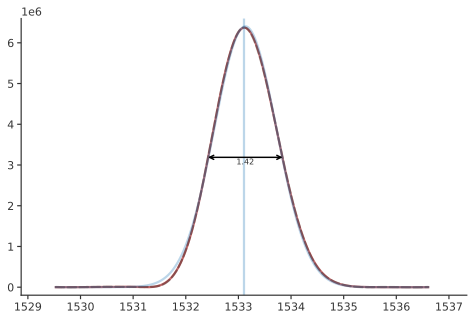

In [189]:
# diag = np.diagonal(z)
# snsphd

# plt.plot(X[0,:-1], z[len(z)//2])

fig, ax = plt.subplots(1,1, figsize=(8,5))

values = z[len(z)//2]
wavelengths = X[0,:-1]


plt.plot(wavelengths, values, color=Colors['red'])

spline = SplineTool(np.array(values), np.array(wavelengths))
ax.plot(*spline.plot_spline(wavelengths,.001), color='k', ls='--', alpha=0.3)
spline.plot_width_at_level_arrows(ax, 0.5)
root = spline.full_width_at_level(0.5, .0001)

ax.set_xlim(spline.spline_max().x - 3*root.width, spline.spline_max().x + 3*root.width)
# print(root.right-root.left)
# ax.set_title("SHG output spectrum")
ax.axvline(spline.spline_max().x, alpha=0.3)
ax.plot(*spline.plot_gaussian_fit(), alpha=0.3, label="gaussian fit")
print("wavelength: ", spline.spline_max().x)
print("bandwidth sigma: ", spline.sigma())


# annotation_list = ax.texts
# # annotation_list.set_color('r')
# for annotation in annotation_list:
#     annotation.set_color('r')

viz.save_light_dark_all(fig, "test")

In [215]:
fig.get_children()[1].get_children()

 Text(1533.83830025442, 3188427.3379718587, ''),
 Text(0, -1, '1.42'),
 Text(0.5, 1.0, ''),
 Text(0.0, 1.0, ''),
 Text(1.0, 1.0, ''),

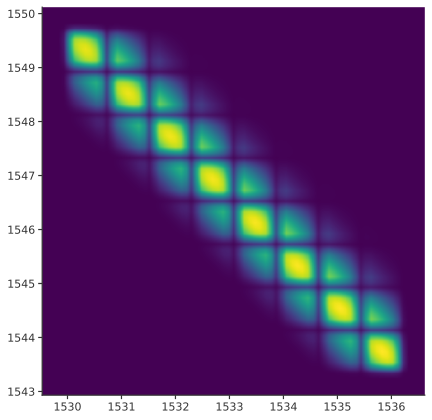

In [45]:

signal_wl, idler_wl, X, Y = create_signal_idler_arrays(data["wl_A"], data["wl_B"], number_pts=500)

flat = np.ones((150,150))

fontsize = 10*1.5
fontsize_x = 9*1.5
fontsize_y = 9*1.5
labelsize = 8*1.5
ticks = np.arange(0, 1.25, 0.25)
# Plotting modes

fig, ax = plt.subplots(1,1,figsize=(8,7))
ax_text_loc = (-0.01, 1.11)


norm = Normalize(vmin=0, vmax=1) # normalization based on the raw data


# dwdm_2d = dwdm2D(X,Y, data["wl_B"][4], data["wl_A"][4])


dwdm_2d = np.zeros(np.shape(X))
for wl_B in data["wl_B"]:
    for wl_A in data["wl_A"]:
        dwdm_2d += dwdm2D(X,Y, wl_B, wl_A, width_adj=1, gaussian=False)

# dwdm_2d_2 = dwdm2D(X,Y, data["wl_B"][1], data["wl_A"][0])X

# signal --> B--> X
# idler --> A--> Y
joint = joint_spectrum(X, Y, fit_params.spdc.gamma, fit_params.A, fit_params)
z = joint*dwdm_2d

# z = z/(np.max(joint)*np.max(dwdm_2d))
dwdm_joint = joint*dwdm_2d/(np.max(joint*dwdm_2d))


z = dwdm_joint[:-1, :-1]

# cp = ax.pcolorfast(X, Y, z) # to make sure the axese are correct
cp = ax.imshow(z,
           extent=[X.min(), X.max(), Y.min(), Y.max()],
           vmin=0, vmax=1,
           interpolation='nearest', origin='lower') # for faster

In [46]:
WIDTH = 1
GAUSSIAN = False

joint = joint_spectrum(X, Y, fit_params.spdc.gamma, fit_params.A, fit_params)
single_dwdm_2d = dwdm2D(X,Y, data["wl_B"][4], data["wl_A"][4], width_adj=WIDTH, gaussian=GAUSSIAN)
dwdm_joint_single = joint*single_dwdm_2d

# z = z/(np.max(joint)*np.max(dwdm_2d))
dwdm_joint_single = dwdm_joint_single/(np.max(dwdm_joint_single))


u_dwdm, s_dwdm, vh_dwdm = np.linalg.svd(dwdm_joint_single)#/np.sum(signal1_idler_twofold))
svd_dwdm = s_dwdm/np.sum(s_dwdm)
ssum = np.sum(svd_dwdm**2)
K= 1/ssum
prinfo(K)
inverse_K = 1/K
prinfo(inverse_K)

K = 1.1560582585413568
inverse_K = 0.8650083095827181


In [47]:
idler

array([1549.32, 1549.32, 1549.32, 1548.51, 1548.51, 1548.51, 1548.51,
       1547.72, 1547.72, 1547.72, 1547.72, 1547.72, 1546.92, 1546.92,
       1546.92, 1546.92, 1546.92, 1546.12, 1546.12, 1546.12, 1546.12,
       1546.12, 1545.32, 1545.32, 1545.32, 1545.32, 1545.32, 1544.53,
       1544.53, 1544.53, 1544.53, 1543.73, 1543.73, 1543.73])

In [48]:


with open('LCS_bands.csv') as csv_file:
    csv_reader = csv.reader(csv_file, delimiter=',')
    wavelengths = []
    channels = []
    band = []
    for row in csv_reader:
        wavelengths.append(float(row[0]))
        channels.append(int(row[1]))
        band.append(row[2])

wavelengths = np.array(wavelengths)
channels = np.array(channels)

idler_full = wavelengths[wavelengths>1542.94]
signal_full = np.flip(wavelengths[wavelengths<1536.61]) # to match data["wl_B"] and data["wl_A"]

idler_full = idler_full[21:]
# print(data["wl_A"])
# print(idler_full)


In [49]:
signal_wl, idler_wl, X_full, Y_full = create_signal_idler_arrays(idler_full, signal_full, number_pts=2000)
# signal_wl, idler_wl, X, Y = create_signal_idler_arrays([1650, 1543.73], [1429.55, 1535.82], number_pts=2000, df=0.8)

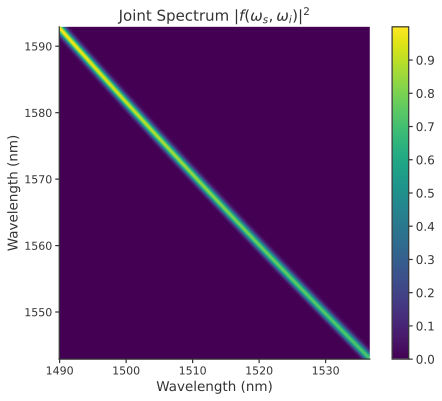

In [50]:
joint = joint_spectrum_no_detector(X_full, Y_full, fit_params.spdc.gamma, fit_params.A, fit_params)
z = joint
z = z[:-1, :-1]/np.max(joint)
scaling = 1
ticks = np.arange(0,1,0.1)

norm = Normalize(vmin=0, vmax=scaling) # normalization based on the raw data

fig, ax = plt.subplots(1,1,figsize=(8,6))
z_normalized_by_raw_data = z

# def create_wide_view_joint_spectrum(ax):
cp = ax.imshow(scaling*z_normalized_by_raw_data,
        extent=[X_full.min(), X_full.max(), Y_full.min(), Y_full.max()],
        vmin=0, vmax=scaling,
        interpolation='nearest', origin='lower') # for faster

ax.set_xlabel("Wavelength (nm)", fontsize=fontsize_x)
ax.set_ylabel("Wavelength (nm)", fontsize=fontsize_y)
ax.set_title(r"Joint Spectrum $|f(\omega_s, \omega_i)|^2$", fontsize=fontsize)
cbar = fig.colorbar(cp, ax=ax)
cbar.ax.tick_params(labelsize=labelsize)
cbar.set_ticks(ticks)

Text(0.5, 1.0, 'Simulated DWDM Diagonal Modes')

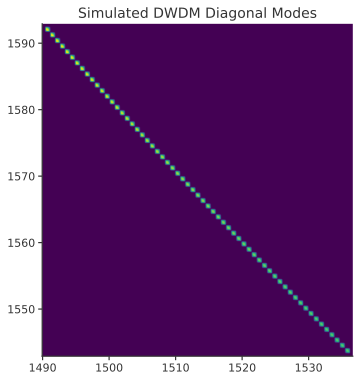

In [51]:
dwdm_2d = np.zeros(np.shape(X_full))
for i, wl_B in enumerate(signal_full):
    for j, wl_A in enumerate(idler_full):
        if i==j:
            dwdm_2d += dwdm2D(X_full,Y_full, wl_B, wl_A, width_adj=1, gaussian=False)
joint = joint_spectrum_no_detector(X_full, Y_full, fit_params.spdc.gamma, fit_params.A, fit_params)


# z = z/(np.max(joint)*np.max(dwdm_2d))
# dwdm_joint = joint/np.max(joint)
dwdm_joint = joint*dwdm_2d/(np.max(joint*dwdm_2d))


z = dwdm_joint[:-1, :-1]

fig, ax = plt.subplots(1,1,figsize=(6,6))
# cp = ax.pcolorfast(X, Y, z) # to make sure the axese are correct
cp = ax.imshow(z,
        extent=[X_full.min(), X_full.max(), Y_full.min(), Y_full.max()],
        vmin=0, vmax=1,
        interpolation='nearest', origin='lower') # for faster
ax.set_title("Simulated DWDM Diagonal Modes")